# Costa Rican Household Poverty Level Prediction
###  Aneesha Nanda, Ansul Sinha, Juan Alvarez, Katie Goulding

In [47]:
# Load in necessary libraries and packages

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.pipeline import make_pipeline  
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV  
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import VarianceThreshold
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVR
from sklearn.preprocessing import Imputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf

import altair as alt
alt.renderers.enable('notebook') 

import warnings
warnings.filterwarnings('ignore')

# Introduction

## About the project

The purpose of this project is to look at what factors of a household are able to predict the need of social welfare assistance. This is important because social welfare programs are often controversial and where resources are distributed will help create a more equitable world. Current methods for identifying where to provide aid and whether certain segments of the population are receiving enough aid rely on these factors and can lead to inaccurate assessments of social need. This research project focuses more on observable traits of a household and demographics of each household member to predict the level of need of a family. 

Using an open source dataset from [kaggle](https://www.kaggle.com/c/costa-rican-household-poverty-prediction/data), we used our prior research into social welfare determinants to drive our analysis. After we turned our outcome into a binary variable, we often refer to our two outcomes as vulnerable and not vulnerable. Our label of "vulnerable" also includes households classified as moderate and extreme poverty.

## About the team

We are group of Informatics students at the University of Washington who like to explore datasets and run models to predict outcomes. This project is for our Introduction to Data Science course.

## Data Preparation

The dataset required a lot of cleaning prior to use. We started off by dropping columns with squared values because they were highly correlated to data that already existed in the dataset and therefore unnecessary. From there, we discovered the edjefe/edjefa columns regarding years of education for the head of the household had a mix of integers and strings. We converted all “no” values to 0 and all “yes” values to 1. The dataset was also originally categorized people into 4 categories of vulnerability in terms of poverty, however we converted it into a binary outcome with 1 being vulnerable and 0 being not vulnerable. 

After the initial preparation of the data, it became necessary to deal with missing values. The “meaneduc” column only had 5 missing values so we imputed 0 knowing this would hardly affect our data. We discovered that the column “v18q1” which was the number of tablets a household owned was directly related to another column dictating whether or not that household had any tablets. The missing values in that column only existed if the household had no tablets, so we were able to impute 0 again. The “res_esc” column which conveyed the number of years a person was behind in school also had many missing values. When we plotted the age distribution, however, it became clear that the missing values were for people either too young to have started school or people who had already completed school so we could confidently fill a 0 in for the missing values as the number of years behind in school. Finally, “v2a1” which informed us of people’s monthly rent payments had many missing values. Luckily, the data table provided us with the type of ownership people had over their homes. We discovered that a majority of people actually owned their homes and therefore had no value in the rent column. Again, we were able to impute a 0 for these rows without skewing the data too much. 

In [48]:
# Read in data to panda
train = pd.read_csv('Data/train.csv')

# Drop column that we cannot interpret and or do not need because they are highly correlated to another column
train_features = train.drop(['Id','dependency','idhogar', 'SQBmeaned', 'SQBescolari', 'SQBage', 'SQBhogar_total', 'SQBedjefe', 'SQBhogar_nin', 'SQBovercrowding', 'SQBdependency', 'agesq'], axis = 1)

In [49]:
# Make data consistent for certain columns by replacing "no" values with 0 and yes values with 1
train_features['edjefe'] = train_features['edjefe'].replace({'no': 0})
train_features['edjefa'] = train_features['edjefa'].replace({'no': 0})
train_features['edjefe'] = train_features['edjefe'].replace({'yes': 1})
train_features['edjefa'] = train_features['edjefa'].replace({'yes': 1})

In [50]:
# Changing target outcome from multilevel into binary

train_features['Target'] = train_features['Target'].replace({1: 1})
train_features['Target'] = train_features['Target'].replace({2: 1})
train_features['Target'] = train_features['Target'].replace({3: 1})
train_features['Target'] = train_features['Target'].replace({4: 0})
train_features.Target.value_counts()

# Create table for outcomes
train_labels = pd.Series([])
train_labels['outcome'] = train_features['Target']


## Dealing with Missing Data

In [51]:
# See how many missing values are in each column
null_columns=train_features.columns[train_features.isnull().any()]
train_features[null_columns].isnull().sum()

v2a1        6860
v18q1       7342
rez_esc     7928
meaneduc       5
dtype: int64

In [52]:
# meaneduc - average years of education for adults (18+)
# This has very few missing values so we can impute 0 without skewing data too much

train_features['meaneduc'].fillna(0, inplace=True)


In [53]:
# v18q1 - number of tablets household owns
# Highly related to v18q which simply tells us if a person owns a table. From first glance it looks like people who don't 
# own a tablet have 'NaN' values in v18q1

# check how many people don't own tablet at all in column v18q
(train_features['v18q'] == 0).sum()

# count is equivalent to number of people who have NaN values in v18q1 which means people who have a 0 in v18q
# are the ones missing data in v18q1 so we can fill in 0 without skewing data

train_features['v18q1'].fillna(0, inplace=True)


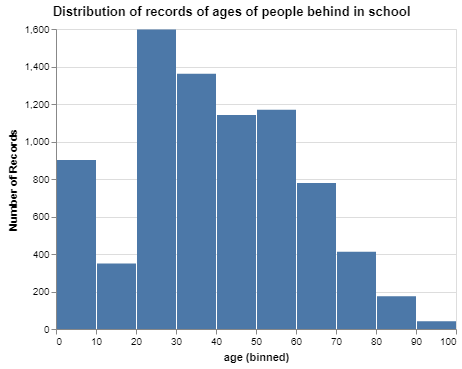

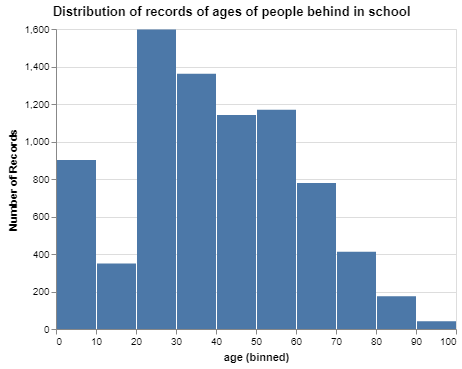

In [54]:
# rez_esc - Years behind in school
# values include NaN, 0, and higher numbers. We

# create boolean variable to store which rows are null for rez_esc
rez_is_null =  train_features['rez_esc'].isna()

# create new data frame with only rows that are null for rez_esc
null_df = train_features[rez_is_null]

# disable altair max rows
alt.data_transformers.enable('default', max_rows=None)

# plot distribution of ages for these rows
alt.Chart(null_df, title="Distribution of records of ages of people behind in school").mark_bar().encode(
    alt.X("age", bin=True),
    y= 'count()',
)

In [55]:
# Majority of people with NaN values for rez_esc are either children too young for school or adults that have already finished
# school so we can impute 0 for the NaN values without skewing data
train_features['rez_esc'].fillna(0, inplace=True)

In [56]:
# v2a1 - Monthly rent payment
# People who own houses don't pay rent. We have columns that tell us whether people own houses or not so we can see if
# there is a relationship between type of home ownership and NaN values in rent 


# create boolean variable to store which rows are null for v2a1 rent
rent_is_null = train_features['v2a1'].isna()

# create new data frame with only rows that are null for rez_esc
null_df = train_features[rent_is_null]

In [57]:
# print the number of people and the type of "ownership"

print("Owns:", (null_df['tipovivi1'] != 0).sum())
print("Installments:", (null_df['tipovivi2'] != 0).sum())
print("Rents: ", (null_df['tipovivi3'] != 0).sum())
print("Precarious: ", (null_df['tipovivi4'] != 0).sum())
print("Other: ",(null_df['tipovivi5'] != 0).sum())

Owns: 5911
Installments: 0
Rents:  0
Precarious:  163
Other:  786


In [58]:
# majority of null values are due to people owning their homes and therefore not paying rent. 
# we can impute 0 for all missing values of rent and not skew any data for over 5,000 datapoints
train_features['v2a1'].fillna(0, inplace=True)

In [59]:
# Check that all missing data has been taken care of
null_columns=train_features.columns[train_features.isnull().any()]
train_features[null_columns].isnull().sum()

Series([], dtype: float64)

# Exploratory Data Analysis

From our background research, we learned that size of family, level of education, and gender are three key factors that make a person more “at risk” of being in poverty. With this in mind, we created two new data frames separated by our outcome variable: vulnerable (includes moderate and extreme poverty) and not vulnerable. 

As we explored the number of people in households, we initially graphed the frequency which visually displayed vulnerable households having more people than non vulnerable households. However, after normalizing the data as a percentage, the graphs conveyed a more truthful story. Interested in how technology ownership is split between our binary outcome, we saw little difference in the ownership of mobile phones and computers.

Our first visual helps us understand the breakdown of our data. It tells us that there are roughly 33% more people who are not vulnerable than there are people who are vulnerable, who are experiencing moderate poverty, or who are experiencing extreme poverty combined. Under the assumption that the data collection process was just, this insight tells us that the majority of households are not vulnerable to poverty. One thing that surprised us as it didn’t match with our research is was the chart displaying the number of people in vulnerable households. While roughly 25% of both vulnerable and non vulnerable households contain 4 people, roughly 25% of vulnerable households have 3 people and roughly 20% of non vulnerable households have 5 people. This was in contrast to the information we found that stated the greater number of people in households is correlated with increased likelihood to be experiencing poverty.


### Number households not vulnerable vs. vulnerable + extreme and moderate poverty

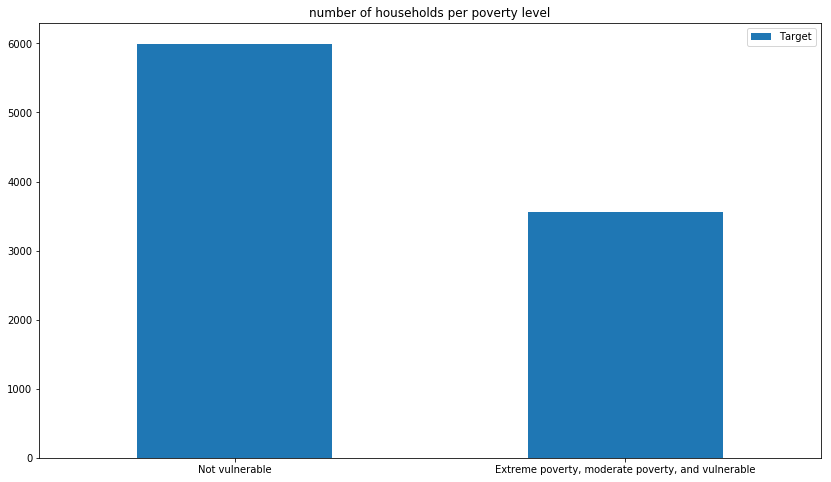

In [60]:
# Create data frame of value counts of the binary outcome variable
target_counts = train_features['Target'].value_counts().to_frame()
target_counts.rename(index={0:"Not vulnerable", 1:"Extreme poverty, moderate poverty, and vulnerable"}, inplace=True)

# Create bar chart of the number of households per target level
ax2 = target_counts.plot(kind='bar',
                    figsize=(14,8),
                    title="number of households per poverty level")
for tick in ax2.get_xticklabels():
    tick.set_rotation(360)

### Number of People in Households (percent)

(0, 50)

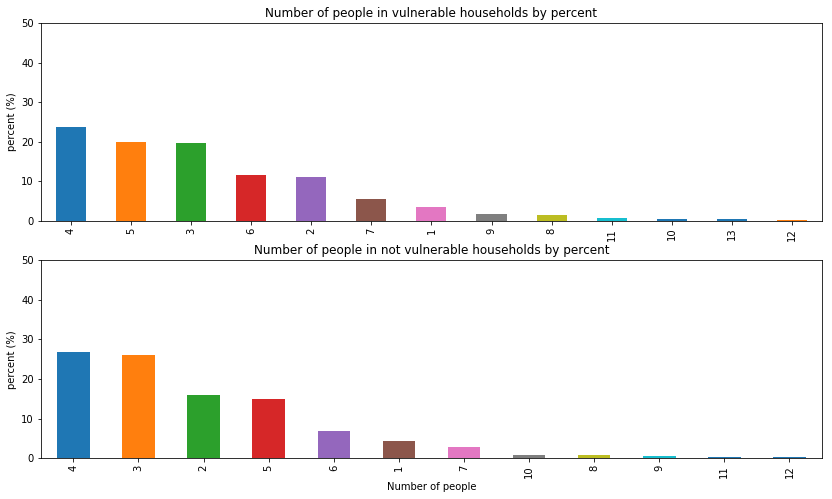

In [61]:
# Create two new data frames splitting the vulnerable households and nonvulnerable households
v_df = train_features[train_features.Target == 1]
nv_df = train_features[train_features.Target == 0]

# Create bar plot displaying the number of people in households
# Broken down by our binary outcome variable and normalized to a percent
plt.subplot(211)
ax = v_df['r4t3'].value_counts(normalize=True).mul(100).plot(kind='bar',
                                    figsize=(14,8),
                                    title="Number of people in vulnerable households by percent")
ax.set_ylabel("percent (%)")
axes = plt.gca()
axes.set_ylim([0, 50])

plt.subplot(212)
ax2 = nv_df['r4t3'].value_counts(normalize=True).mul(100).plot(kind='bar',
                                    figsize=(14,8),
                                    title="Number of people in not vulnerable households by percent")
ax2.set_xlabel("Number of people")
ax2.set_ylabel("percent (%)")
axes = plt.gca()
axes.set_ylim([0, 50])


### Number of people in households (frequency)

(0, 1650)

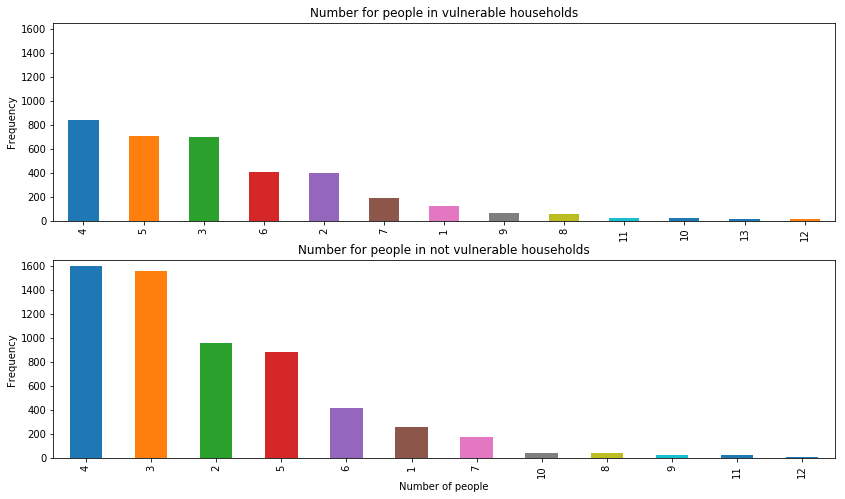

In [62]:
# Create bar chart of number of people in households by frequency instead of percent -- tells different story
plt.subplot(211)
ax = v_df['r4t3'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Number for people in vulnerable households")
ax.set_ylabel("Frequency")
axes = plt.gca()
axes.set_ylim([0, 1650])

plt.subplot(212)
ax2 = nv_df['r4t3'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Number for people in not vulnerable households")
ax2.set_xlabel("Number of people")
ax2.set_ylabel("Frequency")
axes = plt.gca()
axes.set_ylim([0, 1650])

### Years of education of the female head of household

(0, 4100)

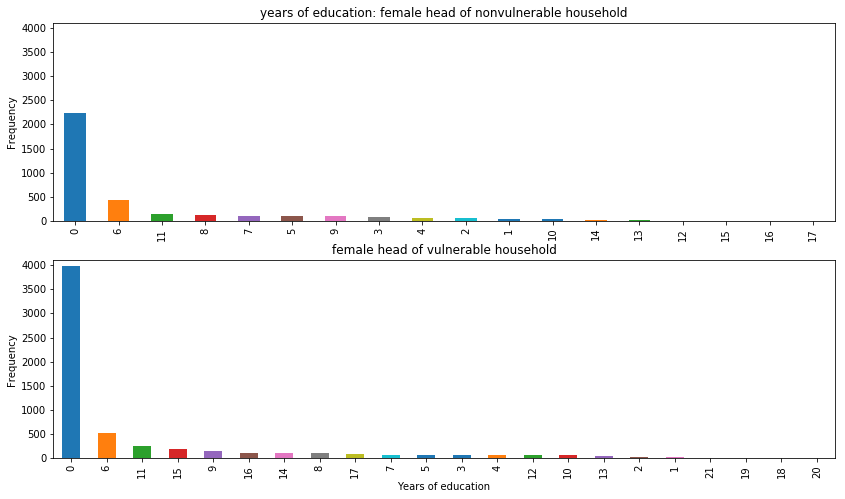

In [63]:
# Create bar chart displaying the years of education of the female head of households
# Broken down by our binary outcome variable
plt.subplot(211)
ax = v_df.edjefa.value_counts().plot(kind='bar',
                    figsize=(14,8),
                    title="years of education: female head of nonvulnerable household")
ax.set_ylabel("Frequency")
axes = plt.gca()
axes.set_ylim([0, 4100])

plt.subplot(212)
ax2 = nv_df.edjefa.value_counts().plot(kind='bar',
                    figsize=(14,8),
                    title="female head of vulnerable household")
ax2.set_xlabel("Years of education")
ax2.set_ylabel("Frequency")
axes = plt.gca()
axes.set_ylim([0, 4100])

### Households that own a mobile phone

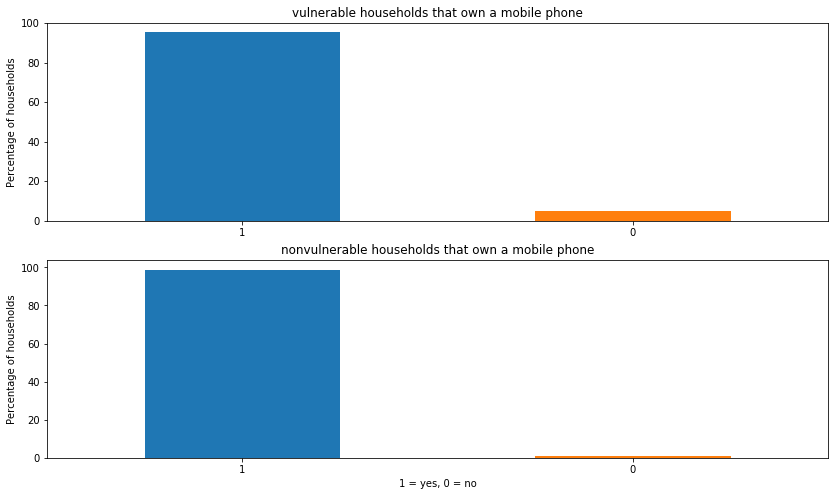

In [64]:
# Create a bar chart of the number of households that own a mobile phone 
# Broken down by binary outcome variable and normalized as a percent
plt.subplot(211)
ax2 = v_df.mobilephone.value_counts(normalize=True).mul(100).plot(kind='bar',
                    figsize=(14,8),
                    title="vulnerable households that own a mobile phone")
ax2.set_ylabel("Percentage of households")

for tick in ax2.get_xticklabels():
    tick.set_rotation(360)

plt.subplot(212)
ax3 = nv_df.mobilephone.value_counts(normalize=True).mul(100).plot(kind='bar',
                    figsize=(14,8),
                    title="nonvulnerable households that own a mobile phone")
ax3.set_xlabel("1 = yes, 0 = no")
ax3.set_ylabel("Percentage of households")

for tick in ax3.get_xticklabels():
    tick.set_rotation(360)

### Households that own a computer

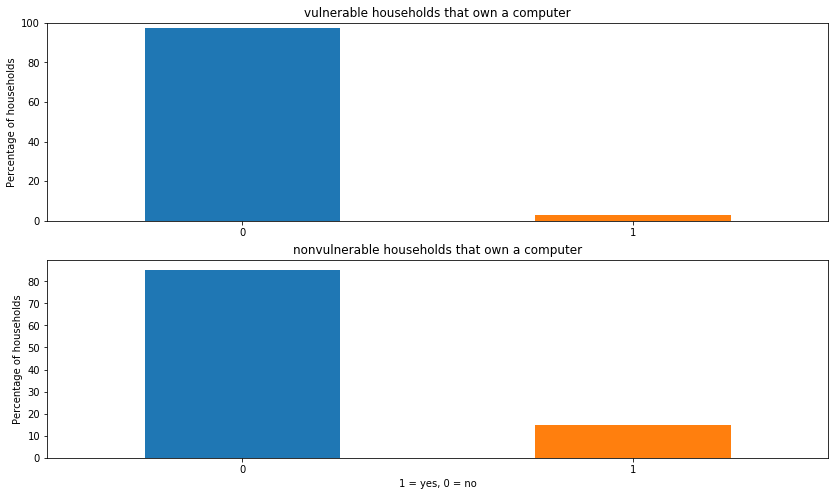

In [65]:
# Create bar chart displaying the number of households that own a computer
# Broken down by binary outcome variable and normalized as a percent
plt.subplot(211)
ax2 = v_df.computer.value_counts(normalize=True).mul(100).plot(kind='bar',
                    figsize=(14,8),
                    title="vulnerable households that own a computer")
ax2.set_ylabel("Percentage of households")

axes = plt.gca()
axes.set_ylim([0, 100])

for tick in ax2.get_xticklabels():
    tick.set_rotation(360)

plt.subplot(212)
ax3 = nv_df.computer.value_counts(normalize=True).mul(100).plot(kind='bar',
                    figsize=(14,8),
                    title="nonvulnerable households that own a computer")
ax3.set_xlabel("1 = yes, 0 = no")
ax3.set_ylabel("Percentage of households")

for tick in ax3.get_xticklabels():
    tick.set_rotation(360)


### Monthly rent

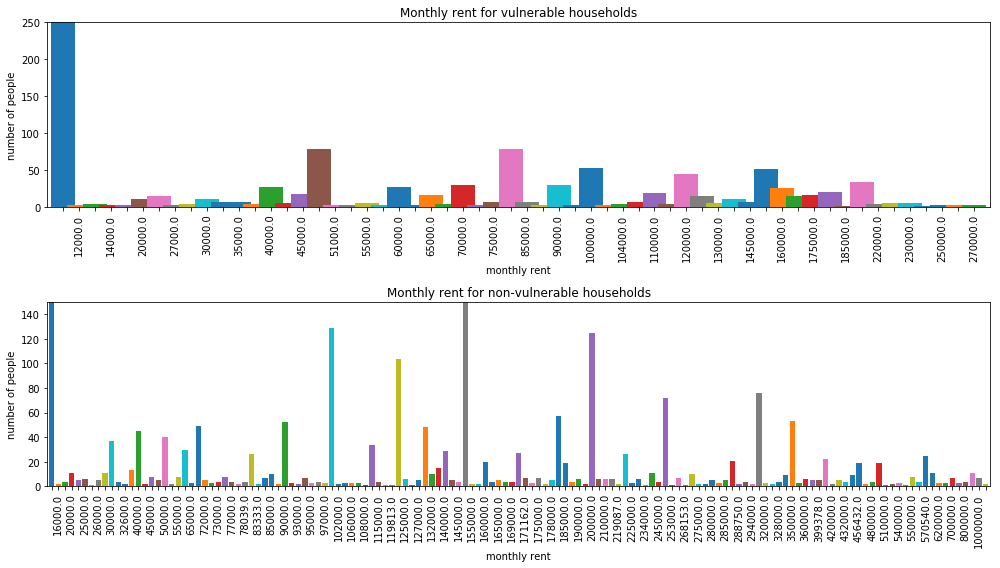

In [66]:
vul_rent = v_df.v2a1.value_counts().sort_index()
notvul_rent = nv_df.v2a1.value_counts().sort_index()


plt.subplot(211)
ax2 = vul_rent.plot(kind='bar',
                    figsize=(14,8),
                    width=1.5,
                    title="Monthly rent for vulnerable households")
ax2.set_ylabel("number of people")
ax2.set_xlabel("monthly rent")
ax2.set_ylim([0, 250])

for label in ax2.xaxis.get_ticklabels()[::2]:
    label.set_visible(False)

    
plt.subplot(212)
ax2 = notvul_rent.plot(kind='bar',
                    figsize=(14,8),
                    width=.8,
                    title="Monthly rent for non-vulnerable households")
ax2.set_ylabel("number of people")
ax2.set_xlabel("monthly rent")
ax2.set_ylim([0, 150])

for label in ax2.xaxis.get_ticklabels()[::2]:
    label.set_visible(False)
    
plt.tight_layout()


# Feature Selection for Statistical Modelling

In terms of selecting the best features for our Logistic model, we decided to take a recursive feature elimination approach to narrow down our 135+ features. Before we ran our RFE model, we removed similar household size columns that correlated to one another. Since we are using a Logistic regression model, our RFE model has to be fitted with a LogisticRegression object. Looking at the top 30 features, we compute a formula string with Target as our dependent variable and the 30 features as our independent variables. 

In [67]:
logistic_dataset = train_features

# drop columns that convey duplicate information
logistic_dataset = logistic_dataset.drop(['tamviv','tamhog','r4t3', 'Target'], axis = 1)#only hhsize is used for household size
model = LogisticRegression()

# create the RFE model and select 30 attributes
rfe = RFE(model, 30)
rfe = rfe.fit(logistic_dataset, train_labels.outcome)

mask = rfe.support_ #list of booleans
new_features = [] # The list of our 30 best features
for boolean, feature in zip(mask, logistic_dataset.columns):
    if boolean:
        new_features.append(feature)

In [68]:
# create logistic regression formula

formula = 'Target ~ ' + " + ".join(new_features)
formula

'Target ~ v18q + r4t1 + paredzinc + paredfibras + pisoother + pisonatur + pisomadera + techootro + abastaguano + noelec + energcocinar2 + energcocinar3 + elimbasu4 + elimbasu6 + eviv3 + dis + hogar_adul + instlevel1 + instlevel2 + instlevel3 + instlevel4 + instlevel5 + instlevel6 + instlevel9 + tipovivi2 + tipovivi3 + tipovivi4 + computer + mobilephone + lugar3'

# Statistical Modeling: Logistic Regression

We conducted a logistic regression analysis for our statistical modeling, which is appropriate for our data as there many independent variables (predicting features), and the dependent variable (our Target) is dichotomous: either the household is vulnerable or it is not.

In [69]:
# Use the `smf.glm` function to fit `default` to `balance` (hint: use the `binomial` family)
model = smf.glm(formula=formula, data=train_features, family=sm.families.Binomial()).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 Target   No. Observations:                 9557
Model:                            GLM   Df Residuals:                     9526
Model Family:                Binomial   Df Model:                           30
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4820.4
Date:                Tue, 04 Dec 2018   Deviance:                       9640.8
Time:                        23:11:52   Pearson chi2:                 1.04e+04
No. Iterations:                    23   Covariance Type:             nonrobust
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         1.0565      0.220      4.812      0.000       0.626       1.487
v18q             -1.1485      0.074    -15.473      0.000      -1.294      -1.003
r4t1              0.6062      0.029     21.249      0.000       0.550       0.662
paredzinc        -0.6618      0.225     -2.936      0.003      -1.104      -0.220
paredfibras       0.5143      0.822      0.626      0.531      -1.096       2.125
pisoother       -23.2988   4.28e+04     -0.001      1.000    -8.4e+04    8.39e+04
pisonatur        22.3087   4.02e+04      0.001      1.000   -7.88e+04    7.88e+04
pisomadera        0.6235      0.100      6.222      0.000       0.427       0.820
techootro       -23.4864   2.51e+04     -0.001      0.999   -4.92e+04    4.91e+04
abastaguano       1.5857      0.639      2.480      0.013       0.332       2.839
noelec           -1.6197      0.530     -3.058      0.002      -2.658      -0.581
energcocinar2    -0.9413      0.120     -7.842      0.000      -1.177      -0.706
energcocinar3    -0.8203      0.119     -6.882      0.000      -1.054      -0.587
elimbasu4        24.0321    3.3e+04      0.001      0.999   -6.47e+04    6.48e+04
elimbasu6       -24.3398    3.6e+04     -0.001      0.999   -7.06e+04    7.06e+04
eviv3            -0.7015      0.053    -13.338      0.000      -0.805      -0.598
dis               0.3513      0.102      3.456      0.001       0.152       0.550
hogar_adul       -0.2549      0.023    -11.016      0.000      -0.300      -0.210
instlevel1        1.2102      0.114     10.647      0.000       0.987       1.433
instlevel2        1.3999      0.107     13.031      0.000       1.189       1.611
instlevel3        1.0893      0.105     10.420      0.000       0.884       1.294
instlevel4        1.0965      0.106     10.355      0.000       0.889       1.304
instlevel5        0.7368      0.118      6.218      0.000       0.505       0.969
instlevel6        1.3757      0.192      7.171      0.000       1.000       1.752
instlevel9       -1.8810      0.724     -2.596      0.009      -3.301      -0.461
tipovivi2        -0.8763      0.102     -8.585      0.000      -1.076      -0.676
tipovivi3        -0.4191      0.066     -6.304      0.000      -0.549      -0.289
tipovivi4         0.9079      0.223      4.065      0.000       0.470       1.346
computer         -0.6654      0.123     -5.420      0.000      -0.906      -0.425
mobilephone      -0.8760      0.160     -5.477      0.000      -1.189      -0.563
lugar3            0.6069      0.101      6.000      0.000       0.409       0.805
=================================================================================
"""

In [70]:
# Generate a set of predicted probabilities using your model
predict = model.predict()
logistic_dataset['predict'] = predict

In [71]:
# Round values so they are in the same 0 or 1 format as the target

logistic_dataset.predict = np.around(logistic_dataset.predict).astype(int)

In [72]:
from sklearn.metrics import confusion_matrix

# Create confusion matrix to see how many false positives, false negatives, true positives, and true negatives the model identified
confusion_matrix = confusion_matrix(train_features.Target, logistic_dataset.predict)
confusion_matrix 

array([[5112,  884],
       [1512, 2049]], dtype=int64)

In [73]:
# create variables for what goes into confusion matrix
true_pos = confusion_matrix[1,1]
true_neg = confusion_matrix[0,0]
false_pos = confusion_matrix[0,1]
false_neg = confusion_matrix[1,0]

# Sensitivity, specificity, and error rates

sensitivity = true_pos / (true_pos + false_neg)
specificity = true_neg / (true_neg + false_pos)

error_1 = 1 - sensitivity
error_2 = 1 - specificity

print(error_1, "is Type I error, where we incorrectly classified true negatives as posivites.")
print(error_2, "is Type II error, where we incorrectly classified true positives as negatives.")


0.4245998315080034 is Type I error, where we incorrectly classified true negatives as posivites.
0.1474316210807205 is Type II error, where we incorrectly classified true positives as negatives.


In [74]:
# find accuracy score of model
from sklearn.metrics import accuracy_score

accuracy_score = accuracy_score(train_features.Target, logistic_dataset.predict)

print("Our accuracy score for logistic regression is", accuracy_score)

Our accuracy score for logistic regression is 0.7492937114157162


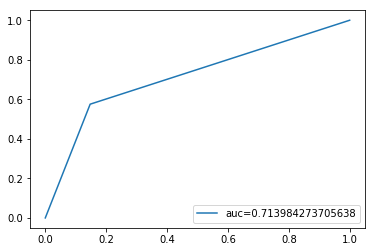

In [75]:
from sklearn import metrics

fpr, tpr, _ = metrics.roc_curve(train_features.Target, logistic_dataset.predict)
auc = metrics.roc_auc_score(train_features.Target, logistic_dataset.predict)
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.show()

## Logistic Regression Insights
An AUC score of 0.714 indicates that the probability of our model ranking a random positive example higher than a random negative example is 71.4%. Since our AUC value is closer to 1, the model does an average job at classifying the outcome, however it can be greatly improved with machine learning models explored below. 

## Splitting Data

The data was split using a standard test size of 0.2 making it so there was 80% training data and 20% testing data. Cross validation when running machine learning models allows this split to be tested over 10 folds of data. 

In [76]:
# Drop target from training features
train_features = train_features.drop(['Target'], axis=1)

In [77]:
# Split data into train and test data 
train_feats, test_feats, train_outcome, test_outcome = train_test_split(
    train_features,
    train_labels.outcome,
    test_size =.2
)


# Random Forest Classifier

This classifier is a collection of decision trees. This tends to be a better version of decision tree because it accounts for decision trees’ tendency to overfit the data to their training set. This algorithm constructs a multitude of decision trees and returns the mean classification. Due to its algorithm, it is typically one of the more accurate models when classifying a binary outcome. 

In [78]:
# Create classifier
rf_clf = RandomForestClassifier()
scaler = MinMaxScaler()
selecter = SelectPercentile()
threshold = VarianceThreshold(.1)
folds = KFold(n_splits = 10, shuffle=True)

# Define a pipeline that uses your scaler and classifier
pipeline = make_pipeline(selecter, threshold, rf_clf)

# Define a grid to search through
param_grid = {"randomforestclassifier__n_estimators":range(1,30)}

# Perform a  grid search of your pipeline
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=folds, scoring="neg_mean_absolute_error")
grid.fit(train_feats, train_outcome)
grid.score(test_feats, test_outcome)


-0.09100418410041841

In [79]:
from sklearn.metrics import confusion_matrix

# use model to predict outcome
preds_RF = grid.predict(test_feats)

# create confusion matrix to determine how many false positives, false negatives, true positives, and true negatives model identified
confusion_matrix_RF = confusion_matrix(test_outcome, preds_RF)
confusion_matrix_RF 

array([[1144,   64],
       [ 110,  594]], dtype=int64)

In [80]:
# create variables for what goes into confusion matrix
true_pos_RF = confusion_matrix_RF[1,1]
true_neg_RF = confusion_matrix_RF[0,0]
false_pos_RF = confusion_matrix_RF[0,1]
false_neg_RF = confusion_matrix_RF[1,0]

# Sensitivity, specificity, and error rates

sensitivity_RF = true_pos_RF / (true_pos_RF + false_neg_RF)
specificity_RF = true_neg_RF / (true_neg_RF + false_pos_RF)

error_1_RF = 1 - sensitivity_RF
error_2_RF = 1 - specificity_RF

print(error_1_RF, "is Type I error, where we incorrectly classified true negatives as posivites.")
print(error_2_RF, "is Type II error, where we incorrectly classified true positives as negatives.")


0.15625 is Type I error, where we incorrectly classified true negatives as posivites.
0.052980132450331174 is Type II error, where we incorrectly classified true positives as negatives.


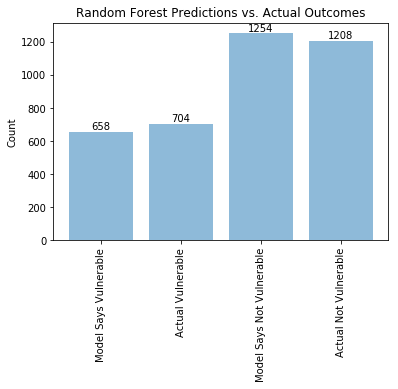

In [81]:
# plot the model predictions compared to the actual outcomes

model_vulnerable_RF = (preds_RF == 1).sum()
model_nonvulnerable_RF = (preds_RF == 0).sum()
actual_vulnerable_RF = (test_outcome==1).sum()
actual_nonvulnerable_RF = (test_outcome==0).sum()

objects_RF = ('Model Says Vulnerable', 'Actual Vulnerable',  'Model Says Not Vulnerable', 'Actual Not Vulnerable')
y_pos_RF = np.arange(len(objects_RF))
outcomes_RF = [model_vulnerable_RF, actual_vulnerable_RF, model_nonvulnerable_RF, actual_nonvulnerable_RF]

bars = plt.bar(y_pos_RF, outcomes_RF, align='center', alpha=0.5)
plt.xticks(y_pos_RF, objects_RF, rotation='vertical')
plt.ylabel('Count')
plt.title('Random Forest Predictions vs. Actual Outcomes')

for rect in bars:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%d' % int(height), ha='center', va='bottom')

plt.show()

## Random Forest Insights

As seen in the chart above of actual vs predicted values, the Random Forest Classifier was successful at predicting if homes are vulnerable to experiencing poverty. In particular, the confusion matrix confirms the minimal percent of false negatives and positives that Random Forest predicts. With a 5.7% error of incorrectly classifying true positives as negatives and an 18.3% error of incorrectly classifying true negatives as positives, we can conclude that Random Forest was successful at predicting vulnerability of experiencing poverty.

# KNN Classifier

KNN Classifier is based on feature similarity; we used it to observe how closely our features resemble our training set; it conducts minimal training or modeling. KNN Classifier is non-parametric, meaning it makes no assumption about the data distribution, so the model structure is based entirely on the data . We chose this classifier as it is a great algorithm in predicting discrete values of its k nearest neighbors. The range for k was selecting after testing several, more expansive ranges for k and comparing processing speed to accuracy. 

In [82]:

# Create classifier
kn_clf = KNeighborsClassifier()

# Define a pipeline that uses your scaler and classifier
pipeline = make_pipeline(selecter, scaler, threshold, kn_clf)

# Define a grid to search through
param_grid = {"kneighborsclassifier__n_neighbors":range(1,10)}

# Perform a  grid search of your pipeline
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=folds, scoring="neg_mean_absolute_error")
grid.fit(train_feats, train_outcome)
grid.score(test_feats, test_outcome)

-0.3091004184100418

In [83]:
# Use model to predict outcomes
preds_KNN = grid.predict(test_feats)

# create confusion matrix to determine how many false positives, false negatives, true positives, and true negatives model identified
confusion_matrix_KNN = confusion_matrix(test_outcome, preds_KNN)
confusion_matrix_KNN

array([[936, 272],
       [319, 385]], dtype=int64)

In [84]:
# create variables for what goes into confusion matrix
true_pos_KNN = confusion_matrix_KNN[1,1]
true_neg_KNN = confusion_matrix_KNN[0,0]
false_pos_KNN = confusion_matrix_KNN[0,1]
false_neg_KNN = confusion_matrix_KNN[1,0]

# Sensitivity, specificity, and error rates

sensitivity_KNN = true_pos_KNN / (true_pos_KNN + false_neg_KNN)
specificity_KNN = true_neg_KNN / (true_neg_KNN + false_pos_KNN)

error_1_KNN = 1 - sensitivity_KNN
error_2_KNN = 1 - specificity_KNN

print(error_1_KNN, "is Type I error, where we incorrectly classified true negatives as posivites.")
print(error_2_KNN, "is Type II error, where we incorrectly classified true positives as negatives.")


0.453125 is Type I error, where we incorrectly classified true negatives as posivites.
0.22516556291390732 is Type II error, where we incorrectly classified true positives as negatives.


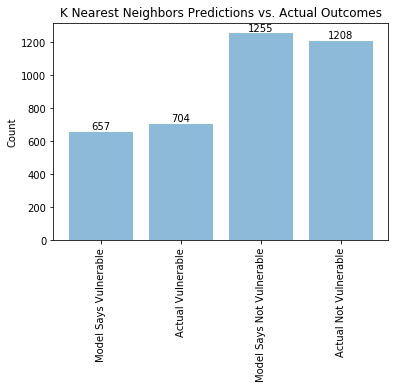

In [85]:
# plot the model predictions compared to the actual outcomes

model_vulnerable_KNN = (preds_KNN == 1).sum()
model_nonvulnerable_KNN = (preds_KNN == 0).sum()
actual_vulnerable_KNN = (test_outcome==1).sum()
actual_nonvulnerable_KNN = (test_outcome==0).sum()

objects_KNN = ('Model Says Vulnerable', 'Actual Vulnerable',  'Model Says Not Vulnerable', 'Actual Not Vulnerable')
y_pos_KNN = np.arange(len(objects_KNN))
outcomes_KNN = [model_vulnerable_KNN, actual_vulnerable_KNN, model_nonvulnerable_KNN, actual_nonvulnerable_KNN]

bars = plt.bar(y_pos_KNN, outcomes_KNN, align='center', alpha=0.5)
plt.xticks(y_pos_KNN, objects_KNN, rotation='vertical')
plt.ylabel('Count')
plt.title('K Nearest Neighbors Predictions vs. Actual Outcomes')


for rect in bars:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%d' % int(height), ha='center', va='bottom')
 
plt.show()

## KNN Insights

Compared to Random Forest, KNN did not perform as accurately. As the chart above conveys, the KNN model was less successful at predicting the the number of not vulnerable households. Our confusion matrix revealed an error of 48.1% where we incorrectly classified true negatives as positives, and 19.3% of the time incorrectly classifying true positives as negatives. These percentages, in particular the 48.1%, is significant and contributes to us claiming that KNN is not the most effective model to use with our data. With a Type I error of 48.1%, this would lead to classifying not vulnerable households as vulnerable. The implications of this revolve around the distribution of resources and might lead to households receiving welfare who aren't in as great of need as other households.

# Decision Tree Classifier

This algorithm solves problems using tree representations. It can be used to predict values of target variables by learning decision rules based on prior training data. This is useful when the outcome is binary.The range for minimum sample leaves was once again found by testing a variety of ranges and narrowing it down to a range that still produced accurate results while having relatively efficient processing speed. 

In [86]:
# Create classifier
tree_clf = DecisionTreeClassifier()

# Define a pipeline that uses your scaler and classifier
pipeline = make_pipeline(selecter, threshold, tree_clf)

# Define a grid to search through
param_grid = {"decisiontreeclassifier__min_samples_leaf":range(1,10)}

# Perform a  grid search of your pipeline
grid = GridSearchCV(pipeline, param_grid=param_grid, cv=folds, scoring="neg_mean_absolute_error")
grid.fit(train_feats, train_outcome)
grid.score(test_feats, test_outcome)

-0.08002092050209204

In [87]:
# Use model to predict outcomes
preds_DT = grid.predict(test_feats)

# create confusion matrix to determine how many false positives, false negatives, true positives, and true negatives model identified
confusion_matrix_DT = confusion_matrix(test_outcome, preds_DT)
confusion_matrix_DT

array([[1145,   63],
       [  90,  614]], dtype=int64)

In [88]:
# create variables for what goes into confusion matrix
true_pos_DT = confusion_matrix_DT[1,1]
true_neg_DT = confusion_matrix_DT[0,0]
false_pos_DT = confusion_matrix_DT[0,1]
false_neg_DT= confusion_matrix_DT[1,0]

# Sensitivity, specificity, and error rates

sensitivity_DT = true_pos_DT / (true_pos_DT + false_neg_DT)
specificity_DT = true_neg_DT / (true_neg_DT + false_pos_DT)

error_1_DT = 1 - sensitivity_DT
error_2_DT = 1 - specificity_DT

print(error_1_DT, "is Type I error, where we incorrectly classified true negatives as posivites.")
print(error_2_DT, "is Type II error, where we incorrectly classified true positives as negatives.")

0.12784090909090906 is Type I error, where we incorrectly classified true negatives as posivites.
0.05215231788079466 is Type II error, where we incorrectly classified true positives as negatives.


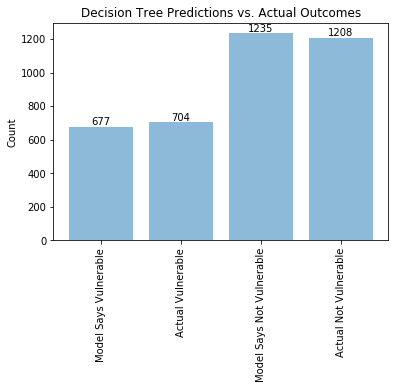

In [89]:
# plot the model predictions compared to the actual outcomes

model_vulnerable_DT = (preds_DT == 1).sum()
model_nonvulnerable_DT = (preds_DT == 0).sum()
actual_vulnerable_DT = (test_outcome==1).sum()
actual_nonvulnerable_DT = (test_outcome==0).sum()

objects_DT = ('Model Says Vulnerable', 'Actual Vulnerable',  'Model Says Not Vulnerable', 'Actual Not Vulnerable')
y_pos_DT = np.arange(len(objects_DT))
outcomes_DT = [model_vulnerable_DT, actual_vulnerable_DT, model_nonvulnerable_DT, actual_nonvulnerable_DT]

bars = plt.bar(y_pos_DT, outcomes_DT, align='center', alpha=0.5)
plt.xticks(y_pos_DT, objects_DT, rotation='vertical')
plt.ylabel('Count')
plt.title('Decision Tree Predictions vs. Actual Outcomes')

for rect in bars:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%d' % int(height), ha='center', va='bottom')
 
plt.show()

## Decision Tree Insights

The Decision Tree Classifier was our most accurate model, predicting less than a difference of 30 for both the actual vulnerable and the actual not vulnerable and the bars in the graph above appearing almost equal. With a 6.2% error (only 0.5% higher than random forest) of incorrectly classifying true negatives as positives and a 13.3% error (the lowest of the three models for Type I), of incorrectly classifying true negatives as positives, the Decision Tree model was the most effective at accurately predicting poverty vulnerability level.

In [90]:
# Create data table to compare error types amongs three models 
d= {'Error Type':['Type I', 'Type II'], 'Random Forest': [error_1_RF, error_2_RF], 'K Nearest Neighbors': [error_1_KNN, error_2_KNN], 'Decision Tree': [error_1_DT, error_2_DT]}
error_data = pd.DataFrame(data=d)
error_data

,Error Type,Random Forest,K Nearest Neighbors,Decision Tree
0,Type I,0.15625,0.453125,0.127841
1,Type II,0.05298,0.225166,0.052152


# Conclusions

We have taken a convoluted data frame from Kaggle, wrangled said data, analyzed each column, ran statistical and machine learning models, and made predictions given each model. The most elaborate part of this project was understanding the data frame. Running explanatory data analysis on major features gave us better insights on the data and what exactly some aspects of the dataset are correlated or tied together. Given a data frame with Spanish feature names, missing data, inconsistent attributes, and replicated columns for household size, we were able to run a recursive feature elimination model to gather our top 30 features using a Logistic regression. The top 30 features included data on whether the individual owned a tablet or computer, if they were younger than 12 years old, what the predominant material on the outside wall, floor, and roof is, main source of energy, education level, etc.  We decided to turn our target column to a binary count because the initial multi-level classification was skewed more towards non-vulnerables, so our model would have been weighed towards predicting more non-vulnerables better and predicting vulnerables poorer. After running both a Logistical regression model, random forest classifier, k-nearest neighbors classifier, and decision tree classifier, we have determined that a decision tree classifier was our most accurate model with predicting less than a difference of 30 for both the actual vulnerable and the actual not vulnerable. Given more of a scope on this project we could of came up with a more feature engineering heavy approach, but given the expansiveness of the amount features, that would have not been the best use of our resources.

Running these models and analyzing the data was important for us to accomplish as it gave us insights on vital data science methods. Likewise, it is important for governments to assist their citizens in any way they can so that they can thrive in a livable condition. With a country like Costa Rica that has had a poverty rate of 22% in 2015, we can predict if a household may be in need so that they may receive some help in terms of welfare assistance.